# Song Vocal Extraction

## Imports

In [1]:
import os
import time

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import librosa
import librosa.display
from IPython.display import Audio
import stempeg
import soundfile as sf

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim

## Grabbing Data

In [2]:
path = "./data/"
song_names = os.listdir(path)
print(len(song_names))

150


## Understanding Data Format

In [3]:
def getSongStems(path, new_sr):
    x, sr = stempeg.read_stems(path, stem_id=[0, 4])
    x = (x[:, :, 0] + x[:, :, 1]) / 2.0
    x = librosa.resample(x, orig_sr=sr, target_sr=new_sr)
    return x, new_sr

In [4]:
file_path = path + song_names[1]
x, sr = getSongStems(file_path, 11025)

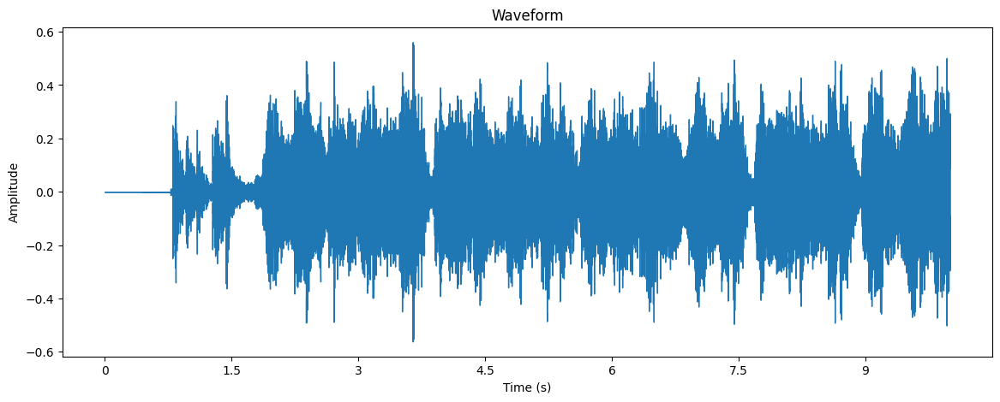

In [5]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x[0, : sr * 10], sr=sr)
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

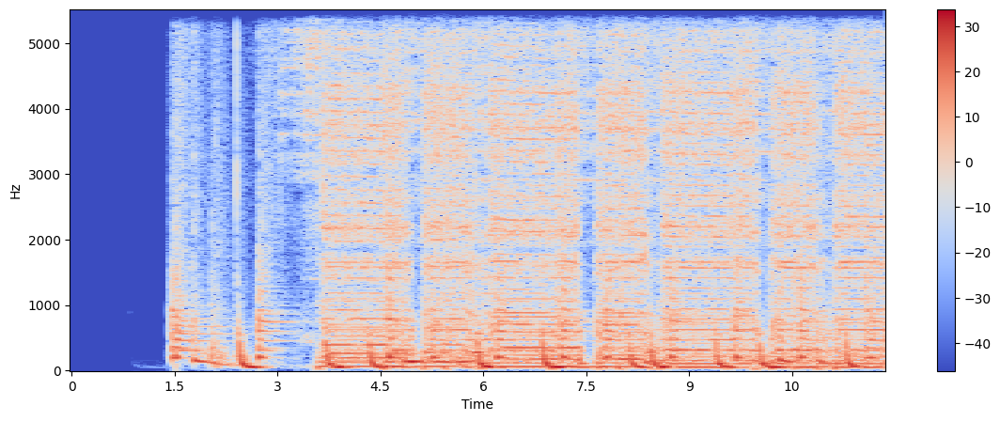

In [6]:
plt.figure(figsize=(14, 5))
db_spec = librosa.amplitude_to_db(abs(librosa.stft(x[0, :sr * 6], n_fft=1024)))[:-1, 3:]
librosa.display.specshow(db_spec, sr=sr, x_axis = "time", y_axis = "hz")
plt.colorbar()

In [7]:
db_spec.shape

(512, 256)

### Playing Full Song

In [8]:
Audio(x[0], rate=sr)

### Playing Isolated Audio

In [9]:
Audio(x[1], rate=sr)

## Data Preparation

### Split Data Into 6 Second Clips

In [33]:
def get_clips(song_name, path, output_dir, new_sr = 11025, segment_duration = 6):
    x, sr = getSongStems(path + song_name, new_sr)
    num_segments = int(len(x[0]) / (segment_duration * sr))
    
    if not os.path.exists(output_dir + "mixtures/"):
        os.makedirs(output_dir + "mixtures/")

    if not os.path.exists(output_dir + "vocals/"):
        os.makedirs(output_dir + "vocals/")
        
    for i in range(num_segments):
        start_sample = i * segment_duration * sr
        end_sample = (i + 1) * segment_duration * sr
        mixture_segment = x[0, start_sample:end_sample]
        vocal_segment = x[1, start_sample:end_sample]
        mixture_output_path = os.path.join(output_dir + "mixtures/", f"{song_name}_segment_{i}.wav")
        vocal_output_path = os.path.join(output_dir + "vocals/", f"{song_name}_segment_{i}.wav")
        sf.write(mixture_output_path, mixture_segment, sr)
        sf.write(vocal_output_path, vocal_segment, sr)

#### Train Test Split Before Creating 10 Second Segments

In [11]:
train_songs, test_songs = train_test_split(song_names, test_size=0.2, random_state=42)

train_output_dir = "./segmented_data/train/"
for song in train_songs:
    get_clips(song, path, train_output_dir)

test_output_dir = "./segmented_data/test/"
for song in test_songs:
    get_clips(song, path, test_output_dir)

### Generate Spectrograms for each Song Segment

In [12]:
def getSpectrograms(path, song_names, new_sr = 11025):
    res = []
    for song_name in song_names:
        x, sr = librosa.load(path + song_name, sr = new_sr)
        X = abs(librosa.stft(x, n_fft=1024)[:-1, 3:])
        X = librosa.amplitude_to_db(X)
        res.append([X])

    return torch.tensor(res)

In [13]:
train_mixture_names = os.listdir("./segmented_data/train/mixtures/")
train_vocal_names = os.listdir("./segmented_data/train/vocals/")
test_mixture_names = os.listdir("./segmented_data/test/mixtures/")
test_vocal_names = os.listdir("./segmented_data/test/vocals/")

train_mixture_spec = getSpectrograms("./segmented_data/train/mixtures/", train_mixture_names)
train_vocal_spec = getSpectrograms("./segmented_data/train/vocals/", train_vocal_names)
test_mixture_spec = getSpectrograms("./segmented_data/test/mixtures/", test_mixture_names)
test_vocal_spec = getSpectrograms("./segmented_data/test/vocals/", test_vocal_names)

C:\Users\user\AppData\Local\Temp\ipykernel_2808\81069780.py:9: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:281.)
  return torch.tensor(res)


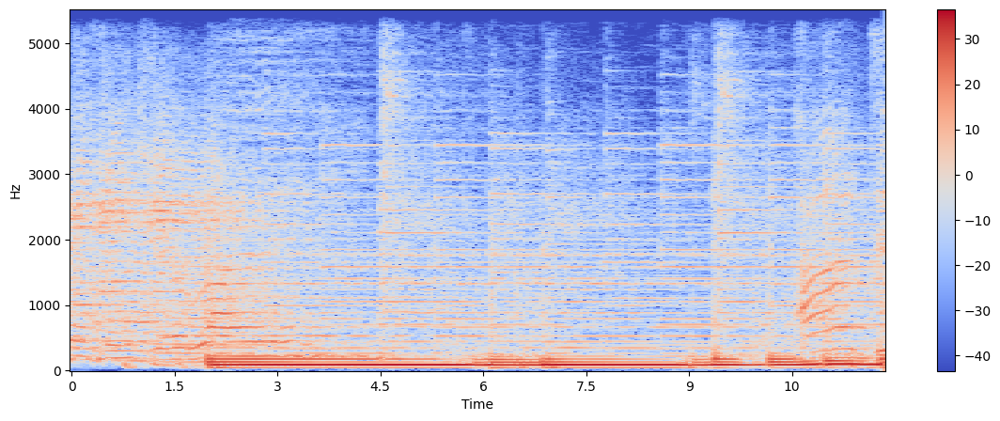

In [14]:
plt.figure(figsize = (14, 5))
librosa.display.specshow(train_mixture_spec[0, 0, :, :].numpy(), sr = 11025, x_axis = "time", y_axis = "hz")
plt.colorbar()

In [15]:
train_mixture_spec.shape

torch.Size([4713, 1, 512, 256])

### Creating PyTorch Database

In [16]:
class SongDataset(Dataset):
    def __init__(self, mixture, vocals):
        self.mixture = mixture
        self.vocals = vocals

    def __len__(self):
        return len(self.mixture)

    def __getitem__(self, idx):
        return self.mixture[idx, :, :], self.vocals[idx, :, :]

In [17]:
train_dataset = SongDataset(train_mixture_spec, train_vocal_spec)
test_dataset = SongDataset(test_mixture_spec, test_vocal_spec)

### Creating PyTorch DataLoaders

In [18]:
train_dl = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_dl = DataLoader(test_dataset, batch_size=32, shuffle=True)

## Defining Basic U-NET

In [24]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size = 3):
        super(ConvBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, padding=kernel_size // 2),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, padding=kernel_size // 2),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.block(x)

class ConvEncoder(ConvBlock):
    def __init__(self, in_channels, kernel_size = 3):
        super(ConvEncoder, self).__init__(in_channels, in_channels * 2, kernel_size)

class ConvDecoder(ConvBlock):
    def __init__(self, in_channels, kernel_size = 3):
        super(ConvDecoder, self).__init__(in_channels, in_channels // 2, kernel_size)

class Upsampler(nn.Module):
    def __init__(self, in_channel):
        super(Upsampler, self).__init__()
        self.conv_t = nn.ConvTranspose2d(in_channel, in_channel // 2, kernel_size=2, stride=2)

    def forward(self, x):
        return self.conv_t(x)

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()    

        # Encoders
        self.encoder1 = ConvBlock(1, 16)
        self.encoder2 = ConvEncoder(16)
        self.encoder3 = ConvEncoder(32)
        self.encoder4 = ConvEncoder(64)
        self.encoder5 = ConvEncoder(128)
        
        # Bottleneck
        self.bottleneck = ConvEncoder(256)
        
        # Transpose Convolutions
        self.up6 = Upsampler(512)
        self.up5 = Upsampler(256)
        self.up4 = Upsampler(128)
        self.up3 = Upsampler(64)
        self.up2 = Upsampler(32)

        # Decoders
        self.decoder5 = ConvDecoder(512)
        self.decoder4 = ConvDecoder(256)
        self.decoder3 = ConvDecoder(128)
        self.decoder2 = ConvDecoder(64)
        self.decoder1 = ConvDecoder(32)
        
        self.mask = nn.Conv2d(16, 1, kernel_size=1)
        
    def forward(self, x):
        og_x = x
        # Encoder
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(nn.MaxPool2d(2)(enc1))
        enc3 = self.encoder3(nn.MaxPool2d(2)(enc2))
        enc4 = self.encoder4(nn.MaxPool2d(2)(enc3))
        enc5 = self.encoder5(nn.MaxPool2d(2)(enc4))
        
        # Bottleneck
        bottleneck = self.bottleneck(nn.MaxPool2d(2)(enc5))
        
        # Decoder
        dec_in_5 = torch.cat((enc5, self.up6(bottleneck)), dim=1)
        dec5 = self.decoder5(dec_in_5)
        dec_in_4 = torch.cat((enc4, self.up5(dec5)), dim=1)
        dec4 = self.decoder4(dec_in_4)
        dec_in_3 = torch.cat((enc3, self.up4(dec4)), dim=1)
        dec3 = self.decoder3(dec_in_3)
        dec_in_2 = torch.cat((enc2, self.up3(dec3)), dim=1)
        dec2 = self.decoder2(dec_in_2)
        dec_in_1 = torch.cat((enc1, self.up2(dec2)), dim=1)
        dec1 = self.decoder1(dec_in_1)
        
        # Output
        mask = self.mask(dec1)
        return mask * og_x

## Defining Training Loop

In [41]:
def save_checkpoint(model, optimizer, epoch, loss, path):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }
    torch.save(checkpoint, path)
    print(f'Checkpoint saved at epoch {epoch}')

In [54]:
def train_model(model, train_loader, test_loader, num_epochs):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    model.train()
    criterion = nn.L1Loss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)

    checkpoint_path = "./checkpoints/"

    if not os.path.exists(checkpoint_path):
        os.makedirs(checkpoint_path)
    
    for epoch in range(num_epochs):
        print(f'Epoch [{epoch+1}/{num_epochs}]')
        epoch_start_time = time.time()
        running_loss = 0.0
        
        for i, data in enumerate(train_loader, 0):
            if (i > 33):
                break
            inputs, targets = data[0].to(device), data[1].to(device)
            if (i % 15 == 0):
                print(f'\tBatch progress [{i * inputs.shape[0]}/{len(train_loader) * inputs.shape[0]}]')
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()

        print(f'Loss: {running_loss/len(train_loader):.4f}')
        epoch_end_time = time.time()
        epoch_duration = epoch_end_time - epoch_start_time

        if (epoch % 5 == 0):
            evaluate_model(model, test_loader)
            save_checkpoint(model, optimizer, epoch + 1, loss.item(), checkpoint_path + f"epoch_{epoch + 1}.pt")
        
    print('Finished Training')

In [55]:
def evaluate_model(model, test_loader):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.eval()
    criterion = nn.L1Loss()
    test_loss = 0.0
    
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            test_loss += loss.item()
    
    print(f'Test Loss: {test_loss/len(test_loader):.4f}')
    model.train()

## Training Model

In [56]:
unet = UNet()

In [ ]:
train_model(unet, train_dl, test_dl, num_epochs=25)

Epoch [1/25]
	Batch progress [0/4736]
Loss: 1.0659
Test Loss: 38.4792
Checkpoint saved at epoch 1
Epoch [2/25]
	Batch progress [0/4736]
Loss: 0.8257
